<a href="https://colab.research.google.com/github/ShyamKumarChand/Collection-of-data/blob/master/Bias_correction_of_numerical_predictionmodel_For_Scaling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from sklearn import preprocessing
matplotlib.style.use('ggplot')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
Url ="http://archive.ics.uci.edu/ml/machine-learning-databases/00514/Bias_correction_ucl.csv"

In [0]:
df = pd.read_csv(Url)

In [4]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [6]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7750.0,13.000000,7.211568,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7682.0,29.768211,2.969999,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7682.0,23.225059,2.413961,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7677.0,56.759372,14.668111,19.794666,45.963543,55.039024,67.190056,98.524734
LDAPS_RHmax,7677.0,88.374804,7.192004,58.936283,84.222862,89.793480,93.743629,100.000153
LDAPS_Tmax_lapse,7677.0,29.613447,2.947191,17.624954,27.673499,29.703426,31.710450,38.542255
LDAPS_Tmin_lapse,7677.0,23.512589,2.345347,14.272646,22.089739,23.760199,25.152909,29.619342
LDAPS_WS,7677.0,7.097875,2.183836,2.882580,5.678705,6.547470,8.032276,21.857621
LDAPS_LH,7677.0,62.505019,33.730589,-13.603212,37.266753,56.865482,84.223616,213.414006
LDAPS_CC1,7677.0,0.368774,0.262458,0.000000,0.146654,0.315697,0.575489,0.967277


In [11]:
df.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [12]:
df[df['station'].isna()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.97471,23.701544,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [13]:
df[df['Date'].isna()]

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.370,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.97471,23.701544,21.621661,15.841235,16.655469,37.6450,127.135,212.335,5.178230,5992.895996,38.9,29.8


In [14]:
for I in df.columns:
    print(df[df[I].isna()])  # all null values in the rows wise Find null Values

      station Date  Present_Tmax  ...  Solar radiation  Next_Tmax  Next_Tmin
7750      NaN  NaN          20.0  ...      4329.520508       17.4       11.3
7751      NaN  NaN          37.6  ...      5992.895996       38.9       29.8

[2 rows x 25 columns]
      station Date  Present_Tmax  ...  Solar radiation  Next_Tmax  Next_Tmin
7750      NaN  NaN          20.0  ...      4329.520508       17.4       11.3
7751      NaN  NaN          37.6  ...      5992.895996       38.9       29.8

[2 rows x 25 columns]
      station        Date  Present_Tmax  ...  Solar radiation  Next_Tmax  Next_Tmin
225       1.0  2013-07-09           NaN  ...      5925.883789       23.4       22.0
271      22.0  2013-07-10           NaN  ...      5772.487305       26.1       24.1
300       1.0  2013-07-12           NaN  ...      5893.265625       23.2       20.5
450       1.0  2013-07-18           NaN  ...      5812.293457       27.6       21.8
464      15.0  2013-07-18           NaN  ...      5681.875000       30.7

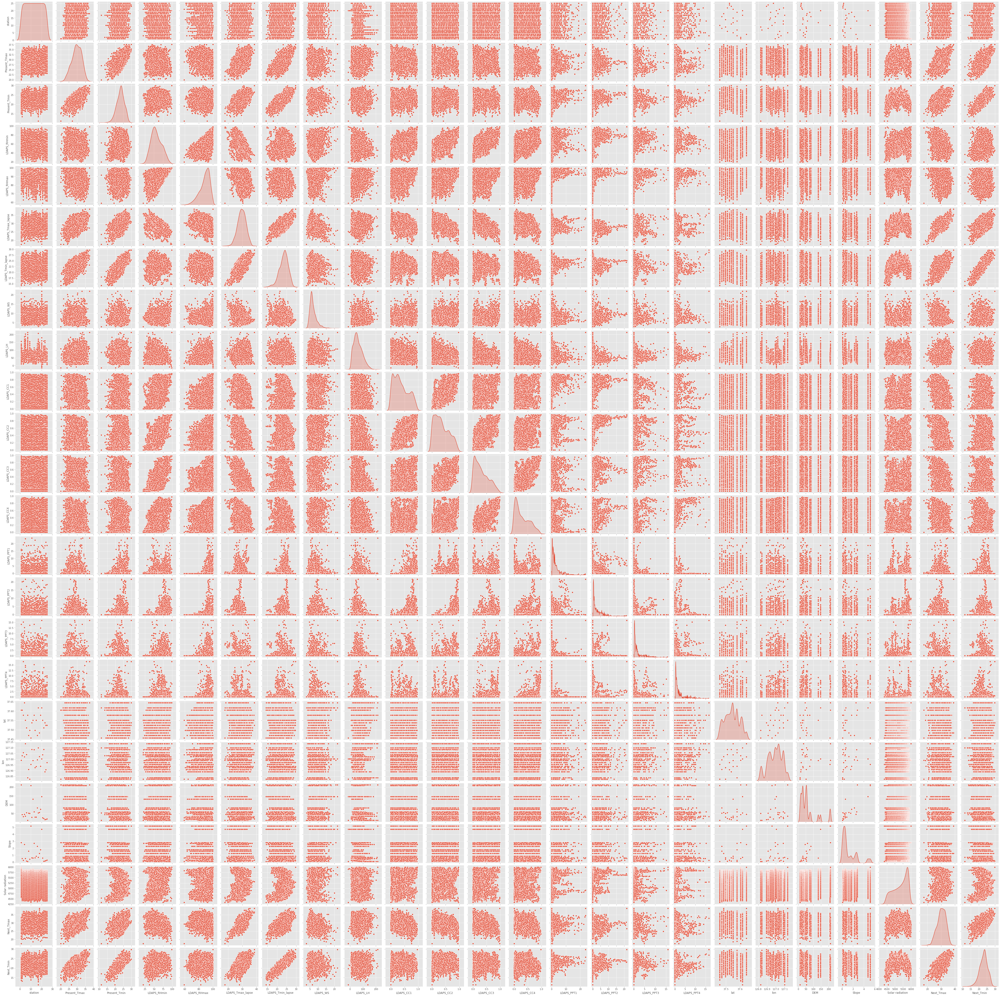

In [16]:
sns.pairplot(df,diag_kind="kde")
plt.savefig("Pairplot.png",dpi=300)

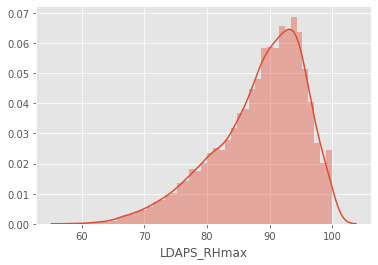

In [18]:
sns.distplot(df.LDAPS_RHmax)

In [0]:
plot = df.drop('Date',axis=1)

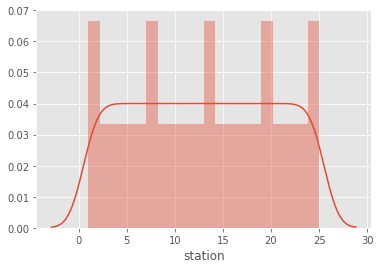

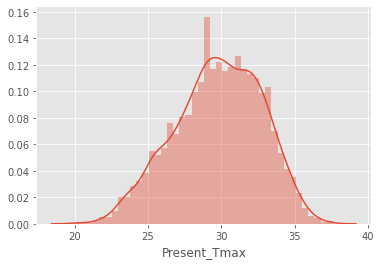

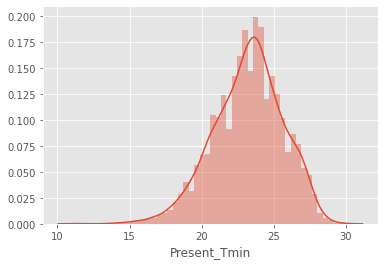

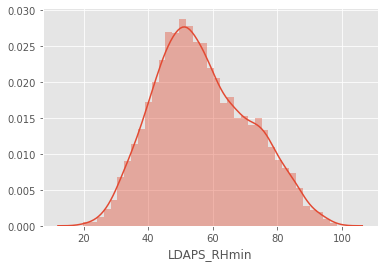

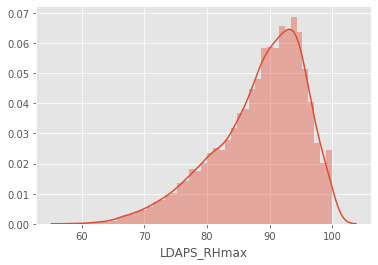

...

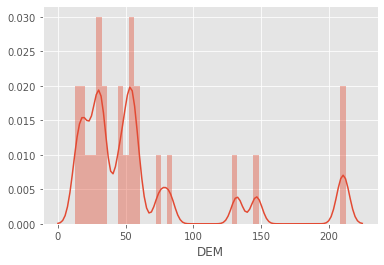

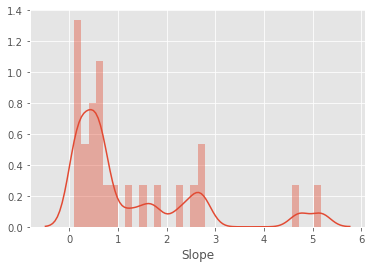

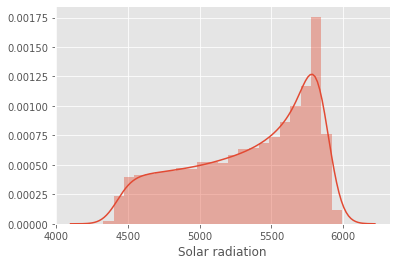

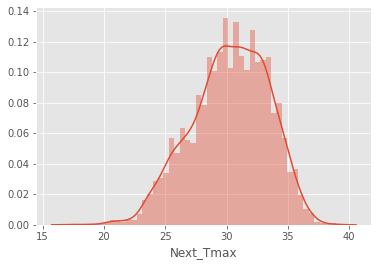

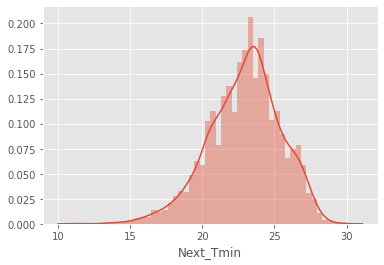

In [20]:
for I in plot.columns:
    sns.distplot(plot[I])
    plt.show()

TypeError: ignored

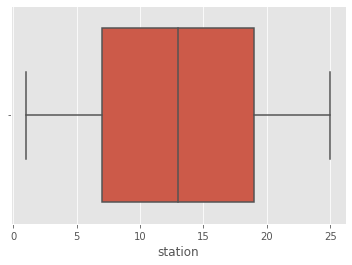

In [23]:
for I in df.columns:
    sns.boxplot(df[I])

In [0]:
df.dropna(axis=1,how='all',inplace=True)

In [0]:
Max = df[['Present_Tmax','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC1','LDAPS_CC2','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT4',
          'lat','lon','DEM','Slope','Solar radiation','Next_Tmax']]

In [26]:
Max.head()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5
2,31.6,83.973587,30.091292,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1
3,32.0,96.483688,29.704629,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7
4,31.4,90.155128,29.113934,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2


In [27]:
Max.tail()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
7747,23.3,78.869858,26.352081,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3
7748,23.3,77.294975,27.010193,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6
7749,23.2,77.243744,27.939516,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8
7750,20.0,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4
7751,37.6,100.000153,38.542255,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9


In [28]:
Max.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Present_Tmax      7682 non-null   float64
 1   LDAPS_RHmax       7677 non-null   float64
 2   LDAPS_Tmax_lapse  7677 non-null   float64
 3   LDAPS_WS          7677 non-null   float64
 4   LDAPS_LH          7677 non-null   float64
 5   LDAPS_CC1         7677 non-null   float64
 6   LDAPS_CC2         7677 non-null   float64
 7   LDAPS_CC3         7677 non-null   float64
 8   LDAPS_CC4         7677 non-null   float64
 9   LDAPS_PPT1        7677 non-null   float64
 10  LDAPS_PPT4        7677 non-null   float64
 11  lat               7752 non-null   float64
 12  lon               7752 non-null   float64
 13  DEM               7752 non-null   float64
 14  Slope             7752 non-null   float64
 15  Solar radiation   7752 non-null   float64
 16  Next_Tmax         7725 non-null   float64


In [29]:
Max.describe()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
count,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000
mean,29.768211,88.374804,29.613447,7.097875,62.505019,0.368774,0.356080,0.318404,0.299191,0.591995,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887
std,2.969999,7.192004,2.947191,2.183836,33.730589,0.262458,0.258061,0.250362,0.254348,1.945768,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010
min,20.000000,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000
25%,27.800000,84.222862,27.673499,5.678705,37.266753,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000
50%,29.900000,89.793480,29.703426,6.547470,56.865482,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000
75%,32.000000,93.743629,31.710450,8.032276,84.223616,0.575489,0.558694,0.496703,0.499489,0.052525,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000
max,37.600000,100.000153,38.542255,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000


In [30]:
Feature = Max.drop(['Next_Tmax'],axis=1)
Feature.head(2)

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500


In [0]:
Feature.replace(np.NaN,0,inplace=True)

In [32]:
Feature.isna().sum()

Present_Tmax        0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
dtype: int64

In [0]:
Target = Max['Next_Tmax']

In [34]:
Target.isna().sum()

27

In [0]:
from sklearn.preprocessing import StandardScaler

In [0]:
ss = StandardScaler()

In [40]:
Scaled_df = ss.fit_transform(Feature)
Scaled_df

array([[-0.1957961 ,  0.32034653, -0.3038293 , ...,  2.77224286,
         1.11500407,  1.51793488],
       [ 0.58796965,  0.27477465,  0.12701613, ..., -0.31515742,
        -0.54215762,  1.22994952],
       [ 0.51449161, -0.31585906,  0.18536551, ..., -0.52621832,
        -0.7231326 ,  1.21653443],
       ...,
       [-1.54289349, -0.91528476, -0.33646809, ..., -0.77904331,
        -0.71933797, -2.0743251 ],
       [-2.32665924, -2.54592642, -2.83788321, ..., -0.91196325,
        -0.8454552 , -2.35821196],
       [ 1.9840524 ,  1.11162375,  2.23483383, ...,  2.77224286,
         2.86143459,  1.51793488]])

In [0]:
Scaled_df = pd.DataFrame(Scaled_df,columns=Feature.columns)

In [43]:
Scaled_df.head()

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-0.195796,0.320347,-0.303829,-0.092185,0.221336,-0.497849,-0.573957,-0.611878,-0.649048,-0.302656,-0.222227,1.189286,-0.005000,2.772243,1.115004,1.517935
1,0.587970,0.274775,0.127016,-0.586164,-0.292012,-0.529859,-0.389214,-0.620851,-0.661611,-0.302656,-0.222227,1.189286,0.511177,-0.315157,-0.542158,1.229950
2,0.514492,-0.315859,0.185366,-0.390529,-1.211307,-0.591169,-0.367227,-0.443025,-0.605101,-0.302656,-0.222227,0.653021,0.838510,-0.526218,-0.723133,1.216534
3,0.612462,0.798413,0.091595,-0.604503,0.112166,-0.564511,-0.488652,-0.614027,-0.636015,-0.302656,-0.222227,1.991696,0.385280,-0.297588,0.932424,1.201176
4,0.465506,0.234730,-0.051656,-0.567266,1.350178,-0.810917,-0.396068,-0.543390,-0.495614,-0.302656,-0.222227,0.118743,1.807917,-0.494322,-0.548433,1.207205


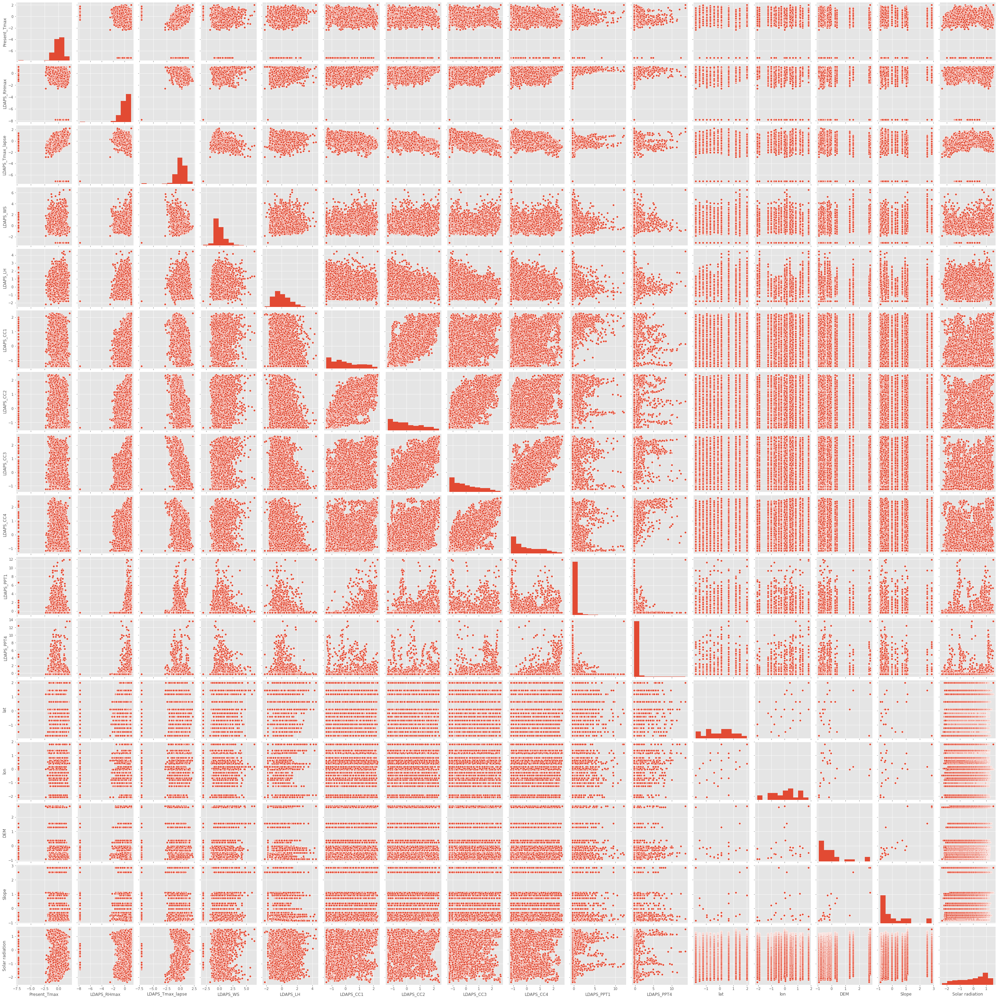

In [44]:
 sns.pairplot(Scaled_df,diag_kind = 'hist')

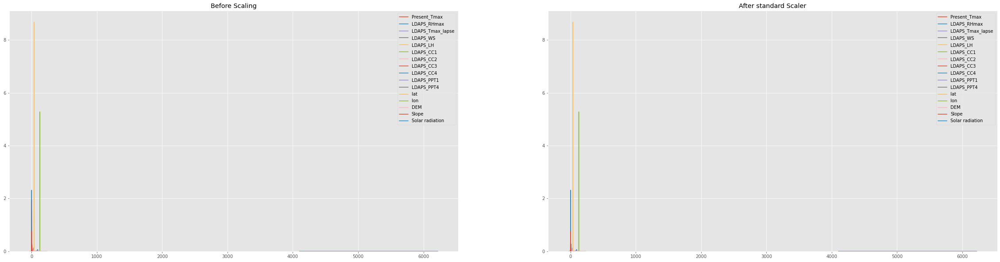

In [49]:
fig, (ax1,ax2) = plt.subplots(ncols = 2,figsize=(40,10))
ax1.set_title('Before Scaling')
sns.kdeplot(df['Present_Tmax'], ax=ax1)
sns.kdeplot(df['LDAPS_RHmax'], ax=ax1)
sns.kdeplot(df['LDAPS_Tmax_lapse'], ax=ax1)
sns.kdeplot(df['LDAPS_WS'], ax=ax1)
sns.kdeplot(df['LDAPS_LH'], ax=ax1)
sns.kdeplot(df['LDAPS_CC1'], ax=ax1)
sns.kdeplot(df['LDAPS_CC2'], ax=ax1)
sns.kdeplot(df['LDAPS_CC3'], ax=ax1)
sns.kdeplot(df['LDAPS_CC4'], ax=ax1)
sns.kdeplot(df['LDAPS_PPT1'], ax=ax1)
sns.kdeplot(df['LDAPS_PPT4'], ax=ax1)
sns.kdeplot(df['lat'], ax=ax1)
sns.kdeplot(df['lon'], ax=ax1)
sns.kdeplot(df['DEM'], ax=ax1)
sns.kdeplot(df['Slope'], ax=ax1)
sns.kdeplot(df['Solar radiation'], ax=ax1)
ax2.set_title('After standard Scaler')
sns.kdeplot(Scaled_df['Present_Tmax'], ax=ax2)
sns.kdeplot(df['LDAPS_RHmax'], ax=ax2)
sns.kdeplot(df['LDAPS_Tmax_lapse'], ax=ax2)
sns.kdeplot(df['LDAPS_WS'], ax=ax2)
sns.kdeplot(df['LDAPS_LH'], ax=ax2)
sns.kdeplot(df['LDAPS_CC1'], ax=ax2)
sns.kdeplot(df['LDAPS_CC2'], ax=ax2)
sns.kdeplot(df['LDAPS_CC3'], ax=ax2)
sns.kdeplot(df['LDAPS_CC4'], ax=ax2)
sns.kdeplot(df['LDAPS_PPT1'], ax=ax2)
sns.kdeplot(df['LDAPS_PPT4'], ax=ax2)
sns.kdeplot(df['lat'], ax=ax2)
sns.kdeplot(df['lon'], ax=ax2)
sns.kdeplot(df['DEM'], ax=ax2)
sns.kdeplot(df['Slope'], ax=ax2)
sns.kdeplot(df['Solar radiation'], ax=ax2)
plt.show()